## Cluster TMAs

**Samples:** 
- JP-TMA-1
- JP-TMA-2

**Method**: just TNBC

Cluster all with Leiden (use GPU to speed up)

In [1]:
#load libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn as sns
import scipy
import scanpy as sc
import matplotlib as mpl
from matplotlib import cm
mpl.rc('figure', max_open_warning = 0)
codedir = '/home/groups/graylab_share/OMERO.rdsStore/engje/Data/20200000/20200406_JP-TMAs'#os.getcwd()
import phenograph
os.chdir('/home/groups/graylab_share/OMERO.rdsStore/engje/Data')
from mplex_image import visualize as viz, process, preprocess, normalize, mics, mpimage
np.random.seed(126)

In [2]:
codedir

'/home/groups/graylab_share/OMERO.rdsStore/engje/Data/20200000/20200406_JP-TMAs'

In [3]:
#change to correct directory
datadir = f'/home/groups/graylab_share/OMERO.rdsStore/engje/Data/20200000/20200406_JP-TMAs/data'
s_date = '20211115'
os.chdir(codedir)
if not os.path.exists(s_date):
    os.mkdir(s_date)
%matplotlib inline

# Table of contents <a name="contents"></a>
1. [Load annotation](#loadold)
2. [load thresholds](#load)
3. [loadJP-TMA](#cluster)
4. [bg subtract](#leiden)
5. [Umap](#l7)
6. [Leiden](#l8)
[annotate](#lbar)
5. [Sub-cluster](#kmeans)
8. [plot](#plpheno)

# Load annotation <a name="loadold"></a>

[contents](#contents)

In [12]:
df_cyc_a = pd.read_csv(f'{codedir}/20210403_JP-TMA1_Annotation+Clinical-Subtype.csv',index_col=0)
df_cyc_a.rename({'ClinicalSubtype':'ID'},axis=1,inplace=True)
#collapse Subtypes
d_replace = {'0':'other','?':'other', np.nan:'other'}
df_cyc_a.ID.replace(d_replace,inplace=True)
df_cyc_a.loc[df_cyc_a.index.str.contains('JP-TMA2-1'),'Accession'] = df_cyc_a.loc[df_cyc_a.index.str.contains('JP-TMA2-1'),'TMA_scene.1']
#add subtype and patient
d_cyc_sub = dict(zip(df_cyc_a.index.tolist(),df_cyc_a.ID.tolist()))
d_patient = dict(zip(df_cyc_a.index,df_cyc_a.Accession))


# thresholds <a name="load"></a>

load thresholds

[contents](#contents)

In [13]:
ls_sample = ['JP-TMA1-1', 'JP-TMA2-1','JE-TMA-42']
df_thresh = pd.DataFrame()
for s_sample in ls_sample:
    df = pd.read_csv(f'{codedir}/data/thresh_JE_{s_sample}.csv',index_col=0)
    df['slide'] = s_sample
    df_thresh =df_thresh.append(df)

In [14]:
df_thresh.loc['global'].dropna(axis=1) #drop 'PDGFRa', 'ColI'
#df_thresh.loc['global'].isna().sum()

,BMP2,CD31,CD44,ColIV,PDPN,Vim,aSMA,AR,EGFR,ER,...,H3K4,LamAC,LamB1,LamB2,CoxIV,Glut1,pAKT,pERK,pS6RP,slide
global,20.0,3.0,3.0,1.5,2.0,2.0,2.0,7.0,2.5,3.0,...,4.0,4.0,1.0,4.0,2.0,2.0,2.0,2.0,2.0,JP-TMA1-1
global,20.0,3.0,3.0,1.5,2.0,2.0,2.0,7.0,1.5,3.0,...,2.0,6.0,1.0,4.0,1.5,2.0,2.0,2.0,2.0,JP-TMA2-1
global,20.0,3.0,3.0,1.5,2.0,2.0,2.0,7.0,1.5,3.0,...,2.0,6.0,1.0,4.0,1.5,2.0,2.0,2.0,2.0,JE-TMA-42


In [15]:
#manual gating
df_man = pd.read_csv(f'{codedir}/data/20211115_JP-TMAs_GatedPositiveCellNames.csv',index_col=0)
df_man['celltype3'] = df_man.celltype.replace({'endothelial':'stromal','tumor':'epithelial'})

# JP-TMAs  <a name="cluster"></a>


[contents](#contents)

In [27]:
os.chdir(datadir)
s_sample = '20210309_JP-TMAs'
df_mi2 = pd.read_csv(f'{datadir}/{s_sample}_FilteredMeanIntensity.csv',index_col=0)
df_mi2.rename({'slide_scene':'slidescene'},axis=1,inplace=True)
df_xy = pd.read_csv(f'{datadir}/{s_sample}_CentroidXY.csv',index_col=0)
df_xy = df_xy.drop('cell',axis=1)

In [28]:
#
df_mi2.columns = [item.split('_')[0] for item in df_mi2.columns]
df_mi2.columns

Index(['EGFR', 'HER2', 'BMP2', 'CD20', 'CD3', 'CD31', 'CD4', 'CD44', 'CD45',
       'CD68', 'CD8', 'ColI', 'ColIV', 'CoxIV', 'Glut1', 'PD1', 'PDGFRa',
       'PDPN', 'R12Qc2', 'R12Qc3', 'R12Qc4', 'R12Qc5', 'R1c2', 'Vim', 'aSMA',
       'pAKT', 'pS6RP', 'CK14', 'CK17', 'CK19', 'CK5', 'CK7', 'CK8', 'Ecad',
       'AR', 'DAPI1', 'DAPI10', 'DAPI11', 'DAPI12', 'DAPI12Q', 'DAPI2',
       'DAPI3', 'DAPI4', 'DAPI5', 'DAPI5Q', 'DAPI6', 'DAPI7', 'DAPI8', 'DAPI9',
       'ER', 'FoxP3', 'GRNZB', 'H3K27', 'H3K4', 'HIF1a', 'Ki67', 'LamAC',
       'LamB1', 'LamB2', 'PCNA', 'PgR', 'R12Qc2', 'R12Qc3', 'R12Qc4', 'R12Qc5',
       'R1c2', 'cPARP', 'gH2AX', 'pERK', 'pHH3', 'pRB', 'slidescene', 'slide',
       'scene'],
      dtype='object')

In [39]:
#43 markers (plus DAPI, area, eccentricity)
print(len(set(df_thresh.loc['global'].dropna(axis=1).columns).intersection(set(df_mi2.columns))))
#ls_marker = sorted(set(df_mi.columns).intersection(set(df_mi2.columns)))
ls_pos = ['AR', 'BMP2', 'CD20', 'CD3','CD31', 'CD4', 'CD44', 'CD45', 'CD68', 'CD8', 'CK14', 'CK17', 'CK19', 'CK5', 'CK7',
 'CK8', 'ColIV', 'CoxIV', 'EGFR', 'ER', 'Ecad', 'FoxP3', 'GRNZB', 'Glut1', 'H3K27', 'H3K4', 'HER2', 'Ki67', 'LamAC', 'LamB1',
 'LamB2', 'PCNA', 'PD1', 'PDPN', 'PgR', 'Vim', 'aSMA', 'pAKT', 'pERK', 'pHH3', 'pRB', 'pS6RP']

43


In [31]:
df_mi2 = df_mi2.merge(df_xy,left_index=True, right_index=True)
df_mi2.rename({'nuclei_area':'area','nuclei_eccentricity':'eccentricity'},axis=1,inplace=True)

In [85]:
df_mi2.tail()

,EGFR,HER2,BMP2,CD20,CD3,CD31,CD4,CD44,CD45,CD68,...,pHH3,pRB,slidescene,slide,scene,area,DAPI_Y,DAPI_X,eccentricity,slide_scene
JP-TMA1-1_scene131_cell2326,373.340000,192.194175,1485.666667,1366.522337,1068.831615,122.639175,102.316151,513.659794,1150.158076,65.828179,...,96.025862,5.922414,JP-TMA1-1_scene131,JP-TMA1-1,scene131,116.0,5461.706897,1752.913793,0.945991,JP-TMA1-1_scene131
JP-TMA1-1_scene131_cell2327,392.978261,186.272727,1537.288462,1403.379808,1096.466346,240.706731,105.932692,499.889423,1188.269231,103.403846,...,0.000000,242.242604,JP-TMA1-1_scene131,JP-TMA1-1,scene131,169.0,5462.301775,2769.603550,0.837013,JP-TMA1-1_scene131
JP-TMA1-1_scene131_cell2329,302.114035,223.517544,1700.164122,1527.576336,1163.900763,208.637405,98.931298,562.732824,1234.251908,93.156489,...,106.701923,111.384615,JP-TMA1-1_scene131,JP-TMA1-1,scene131,208.0,5471.120192,1902.605769,0.761009,JP-TMA1-1_scene131
JP-TMA1-1_scene131_cell2330,350.330986,216.741497,1606.778481,1548.756329,1181.537975,186.351266,49.879747,562.237342,1173.332278,115.838608,...,64.656604,17.090566,JP-TMA1-1_scene131,JP-TMA1-1,scene131,265.0,5473.852830,1881.950943,0.873270,JP-TMA1-1_scene131
JP-TMA1-1_scene131_cell2331,273.409836,218.647541,1667.254777,1515.105096,1157.267516,206.805732,95.210191,549.038217,1329.875796,102.273885,...,68.301136,134.426136,JP-TMA1-1_scene131,JP-TMA1-1,scene131,176.0,5474.153409,1932.880682,0.867829,JP-TMA1-1_scene131


In [86]:
s_out = f'{codedir}/data/20211115_JP-TMAs_FilteredMeanIntensity.csv'
if not os.path.exists(s_out):
    print('saving csv')
    df_mi2.to_csv(s_out)

saving csv


# Background subtract <a name="leiden"></a>


[contents](#contents)

In [87]:
ls_sample

['JP-TMA1-1', 'JP-TMA2-1', 'JE-TMA-42']

In [88]:
#subtract background
df_bg_all = pd.DataFrame()
for s_sample in ls_sample:
    print(s_sample)
    d_bg = df_thresh[df_thresh.slide==s_sample].loc['global'].dropna().drop('slide').to_dict()
    df_bg = df_mi2[df_mi2.slide==s_sample].copy()
    for s_marker, i_thresh in d_bg.items():
        df_bg[s_marker] = np.clip(df_mi2.loc[df_mi2.slide==s_sample,s_marker] - i_thresh*256, a_min=0, a_max=None)
    df_bg_all = df_bg_all.append(df_bg)
    #break

['JP-TMA1-1', 'JP-TMA2-1', 'JE-TMA-42']
['JP-TMA1-1', 'JP-TMA2-1', 'JE-TMA-42']
['JP-TMA1-1', 'JP-TMA2-1', 'JE-TMA-42']


In [94]:
s_out = f'{codedir}/data/20211115_JP-TMAs_BGSubtractedMeanIntensity.csv'
if not os.path.exists(s_out):
    print('saving csv')
    df_bg_all.to_csv(s_out)

saving csv


## Umap <a name="l7"></a>


[contents](#contents)

In [4]:
import scanpy as sc
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
os.chdir(datadir)
df_both = pd.read_csv('20211115_JP-TMAs_FilteredMeanIntensity.csv',index_col=0)
df_norm = pd.read_csv('20211115_JP-TMAs_BGSubtractedMeanIntensity.csv',index_col=0)

In [7]:
d_replace = {'Basal like Cells':'other',
 'Claudin-Low Cells':'other',
 'Colon Cancer':'other',
 #'ER+',
 'HER2 Cells':'other',
 #'HER2+',
 'Luminal A Cells':'other',
 'Luminal B Cells':'other',
 #'Normal Breast',
 #'Normal Tonsil',
 'Pancreas':'other',
 'Smooth muscle':'other',
 #'TNBC','other'
            }

In [8]:
#32 features

ls_col = ['EGFR', 'HER2', 'BMP2', 'CD20', 'CD3', 'CD31', 'CD4', 'CD44', 'CD45',
       'CD68', 'CD8',  'ColIV', 'CoxIV', 'Glut1', 'PD1', #'PDGFRa','ColI',
       'PDPN',  'R1c2', 'Vim', 'aSMA',
        'pS6RP', 'CK14', 'CK17',  'CK5', 'CK7', 'CK8',# 'Ecad','CK19',
       'AR', 'DAPI11', 'ER', 'FoxP3', 'GRNZB', 'H3K27', 'H3K4',  'Ki67', 'LamAC',
       'LamB1', 'LamB2', 'PCNA', 'PgR', 'area', #'cPARP', 'gH2AX', 'pERK', 'pHH3', 'pRB','HIF1a','pAKT','DAPI_Y', 'DAPI_X',
        'eccentricity']
print(len(ls_col))
#adata = sc.AnnData(df_norm.merge(df_both.loc[:,['area','eccentricity']],left_index=True,right_index=True).loc[:,ls_col])
adata = sc.AnnData(df_norm.loc[:,ls_col])

40


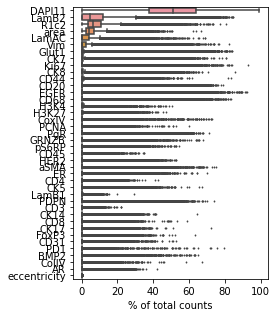

<Figure size 432x288 with 0 Axes>

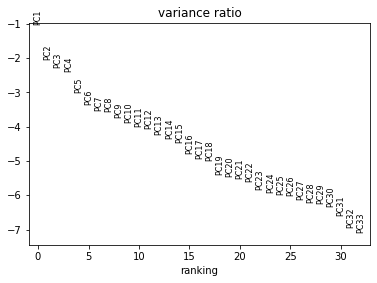

NameError: name 'd_cyc_sub' is not defined

In [9]:
#raw
adata.raw = adata
#reduce dimensionality
sc.tl.pca(adata, svd_solver='auto')
fig,ax=plt.subplots(figsize=(3.5,5))
sc.pl.highest_expr_genes(adata, n_top=48,ax=ax,save=f'Expression_{len(ls_col)}.png')
plt.tight_layout()
sc.pl.pca_variance_ratio(adata,n_pcs=32, log=True)
adata.obs['TMA'] = [item.split('_')[0] for item in adata.obs.index]
adata.obs['slide_scene'] = [item.split('_cell')[0] for item in adata.obs.index]
adata.obs['subtype'] = adata.obs.slide_scene.map(d_cyc_sub).fillna('other').replace(d_replace)
adata.obs['celltype3'] = df_man.loc[adata.obs.index,'celltype3']

loading umap


/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'slide_scene' as categorical
/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'subtype' as categorical
/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pan

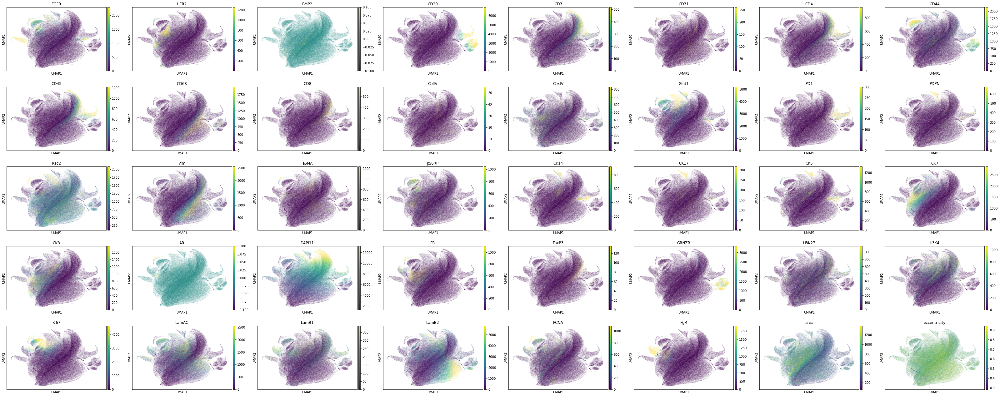

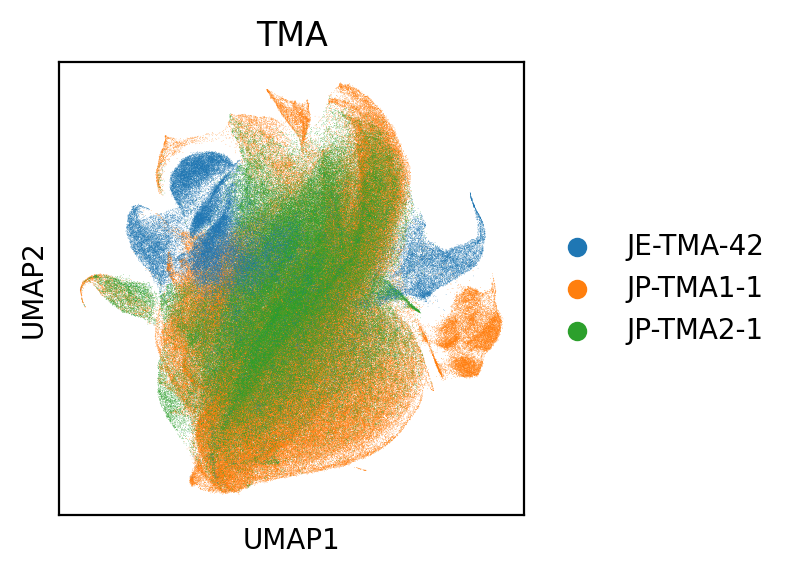

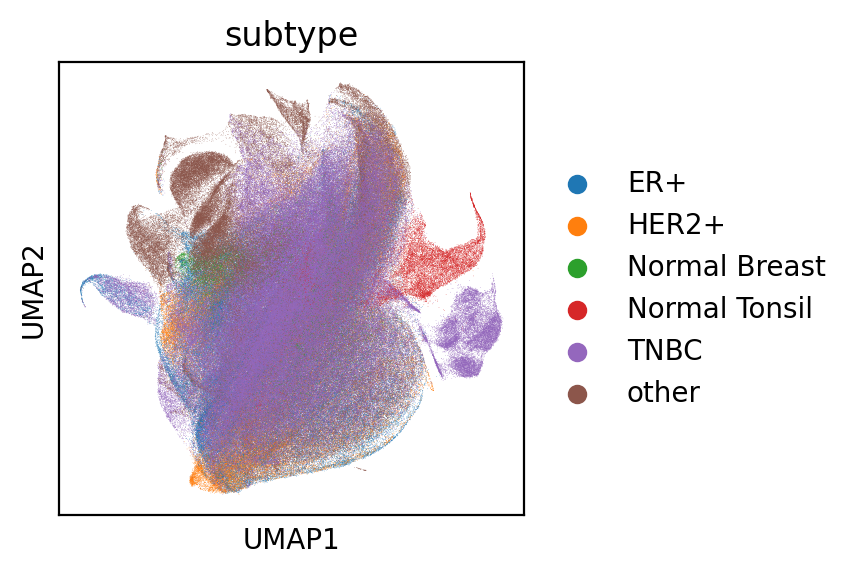

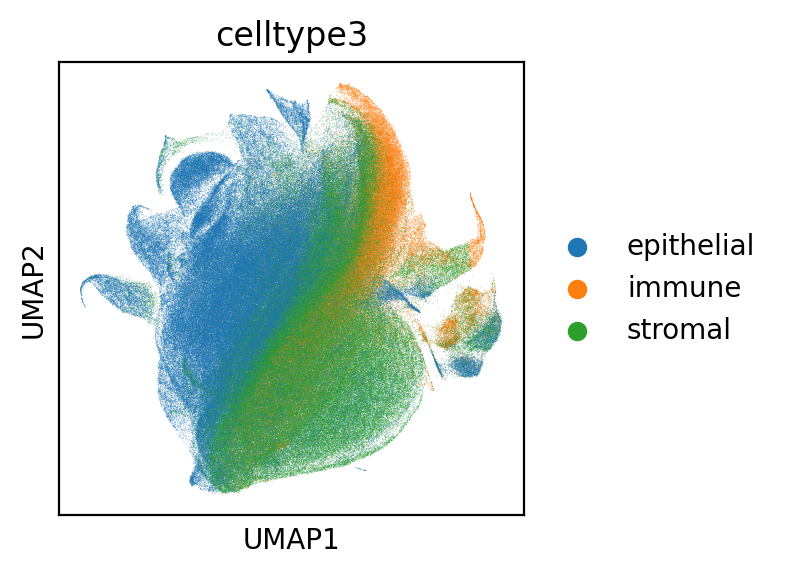

In [142]:
for n_neighbors in [15,30]:
    results_file = f'20211115_JP-TMAs_{n_neighbors}neighbors_{len(ls_col)}markers.h5ad'
    if not os.path.exists(results_file):
        print('calc umap')
        # calculate neighbors 
        sc.pp.neighbors(adata, n_neighbors=n_neighbors) #, method='rapids'
        sc.tl.umap(adata)
    else:
        print('loading umap')
        adata = sc.read_h5ad(results_file)
        adata.obs['slide_scene'] = [item.split('_cell')[0] for item in adata.obs.index]
        adata.obs['subtype'] = adata.obs.slide_scene.map(d_cyc_sub).fillna('other').replace(d_replace)
        adata.obs['celltype3'] = df_man.loc[adata.obs.index,'celltype3']
    #save results

    #color by markers
    figname = f"Umap_markers_{n_neighbors}neighbors_{len(ls_col)}markers.png"
    sc.pl.umap(adata, color=ls_col,vmin='p1.5',vmax='p98.5',save=figname,ncols=8)
    #color by TMA
    figname = f"Umap_TMA_{n_neighbors}neighbors_{len(ls_col)}markers.png"
    fig,ax = plt.subplots(figsize=(3,3), dpi=200)
    sc.pl.umap(adata, color='TMA',wspace=.25,save=figname,ax=ax)
    
    figname = f"Umap_subtype_{n_neighbors}neighbors_{len(ls_col)}markers.png"
    fig,ax = plt.subplots(figsize=(3,3), dpi=200)
    sc.pl.umap(adata, color='subtype',wspace=.25,save=figname,ax=ax)
    
    figname = f"Umap_celltype3_{n_neighbors}neighbors_{len(ls_col)}markers.png"
    fig,ax = plt.subplots(figsize=(3,3), dpi=200)
    sc.pl.umap(adata, color='celltype3',wspace=.25,save=figname,ax=ax)
    
    if not os.path.exists(results_file):
        adata.write(results_file)
    break


In [70]:
#just TNBC - good tnbc markers
ls_col = ['EGFR', 'BMP2', # 'HER2',
 'CD3', 'CD31', 'CD4', 'CD44', 'CD45', 'CD68', 'CD8',
 'ColIV', 'CoxIV', 'Glut1', 'PD1', 'PDPN', 'R1c2',
 'Vim', 'aSMA', 'pS6RP', 'CK14', 'CK17', 'CK5', 'CK7', 'CK8', 'AR',
 'DAPI11','Ecad','CK19','FoxP3',# 'ER',  'FoxP3','GRNZB',: background
 'H3K27', 'H3K4', 'Ki67', 'LamAC', 'LamB1', 'LamB2', 'PCNA',# 'PgR',
 'area', 'eccentricity']
df_norm['subtype'] = df_norm.slide_scene.map(d_cyc_sub).fillna('other').replace(d_replace)

In [71]:
len(ls_col)

37

calc umap


/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'TMA' as categorical
/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'slide_scene' as categorical
/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.

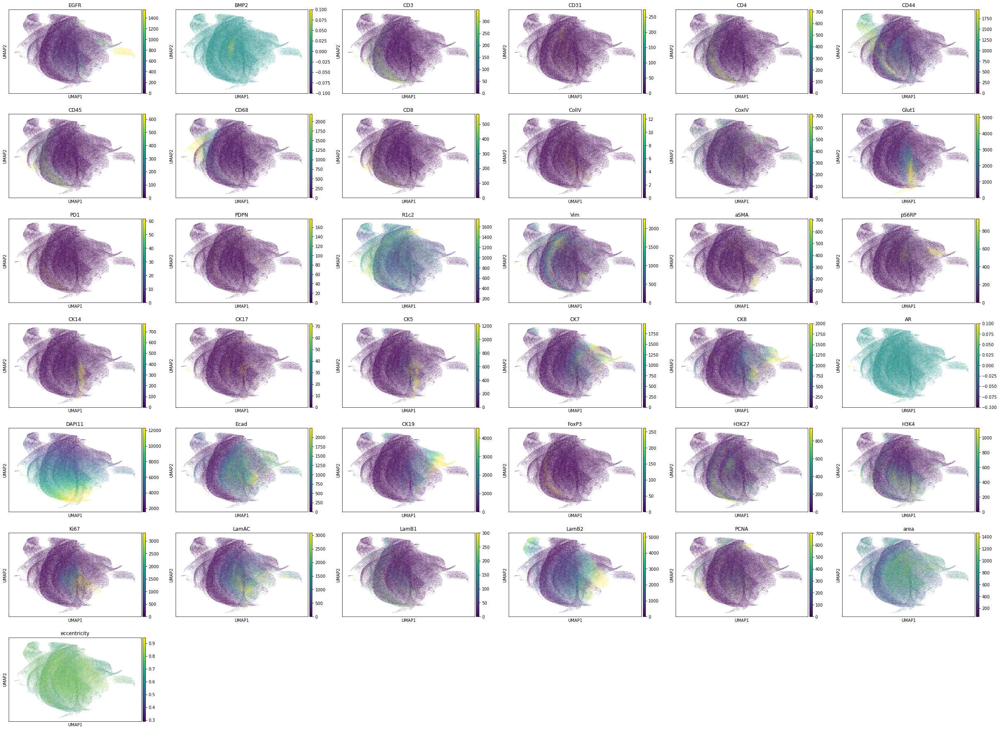

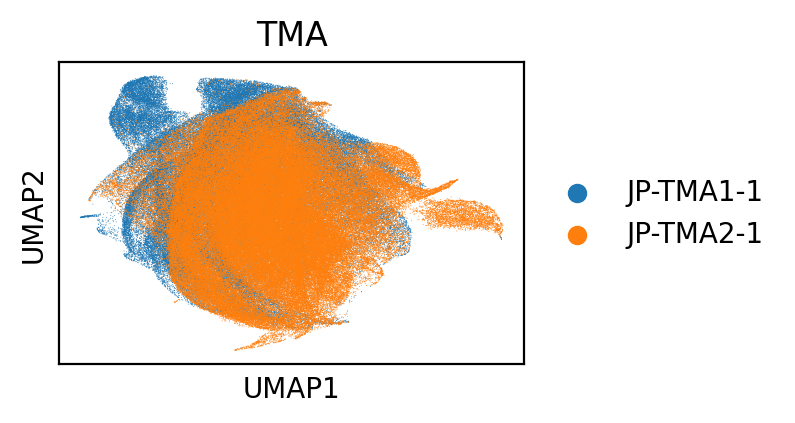

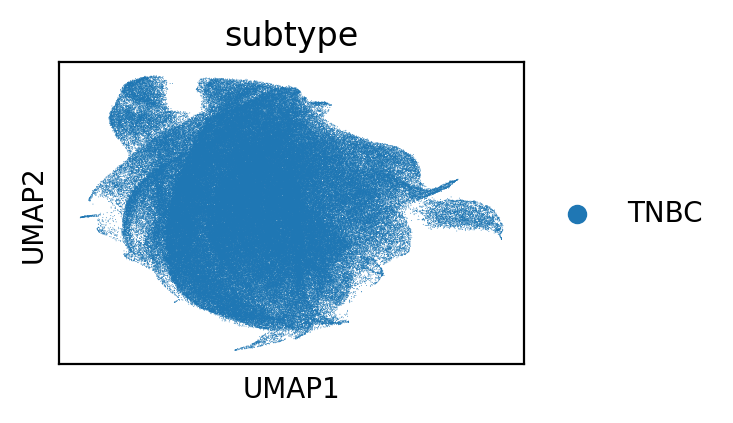

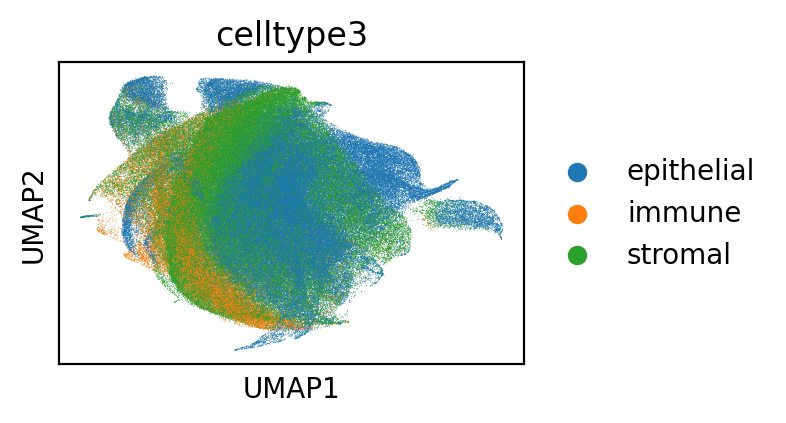

In [17]:
#just TNBC
adata1 = sc.AnnData(df_norm.loc[df_norm.subtype == 'TNBC',ls_col])
n_neighbors = 15
results_file = f'20211115_JP-TMAs_{n_neighbors}neighbors_{len(ls_col)}markers_TNBC.h5ad'  
if not os.path.exists(results_file):
    print('calc umap')
    # calculate neighbors 
    sc.pp.neighbors(adata1, n_neighbors=n_neighbors) #, method='rapids'
    sc.tl.umap(adata1)
    adata1.obs['TMA'] = [item.split('_')[0] for item in adata1.obs.index]
    adata1.obs['slide_scene'] = [item.split('_cell')[0] for item in adata1.obs.index]
    adata1.obs['subtype'] = adata1.obs.slide_scene.map(d_cyc_sub).fillna('other').replace(d_replace)
    adata1.obs['celltype3'] = df_man.loc[adata1.obs.index,'celltype3']
    adata1.write(results_file)
else:
    print('loading umap')
    adata1 = sc.read_h5ad(results_file)
    adata1.obs['TMA'] = [item.split('_')[0] for item in adata1.obs.index]
    adata1.obs['slide_scene'] = [item.split('_cell')[0] for item in adata1.obs.index]
    adata1.obs['subtype'] = adata1.obs.slide_scene.map(d_cyc_sub).fillna('other').replace(d_replace)
    adata1.obs['celltype3'] = df_man.loc[adata1.obs.index,'celltype3']
#color by markers
figname = f"Umap_markers_{n_neighbors}neighbors_{len(ls_col)}markers_TNBC.png"
sc.pl.umap(adata1, color=ls_col,vmin='p1.5',vmax='p98.5',save=figname,ncols=6)
#color by TMA
figname = f"Umap_TMA_{n_neighbors}neighbors_{len(ls_col)}markers_TNBC.png"
fig,ax = plt.subplots(figsize=(3,2), dpi=200)
sc.pl.umap(adata1, color='TMA',wspace=.25,save=figname,ax=ax)

figname = f"Umap_subtype_{n_neighbors}neighbors_{len(ls_col)}markers_TNBC.png"
fig,ax = plt.subplots(figsize=(3,2), dpi=200)
sc.pl.umap(adata1, color='subtype',wspace=.25,save=figname,ax=ax)

figname = f"Umap_celltype3_{n_neighbors}neighbors_{len(ls_col)}markers_TNBC.png"
fig,ax = plt.subplots(figsize=(3,2), dpi=200)
sc.pl.umap(adata1, color='celltype3',wspace=.25,save=figname,ax=ax)

##  Cluster Leiden <a name="l8"></a>

main cell types


[contents](#contents)

In [18]:
results_file

'20211115_JP-TMAs_15neighbors_37markers_TNBC.h5ad'

In [20]:
s_sample = '20211115_JP-TMAs'
n_neighbors = 15
n_markers = 37
s_type = 'TNBC'
adata = sc.read_h5ad(f'{s_sample}_{n_neighbors}neighbors_{n_markers}markers_{s_type}.h5ad')

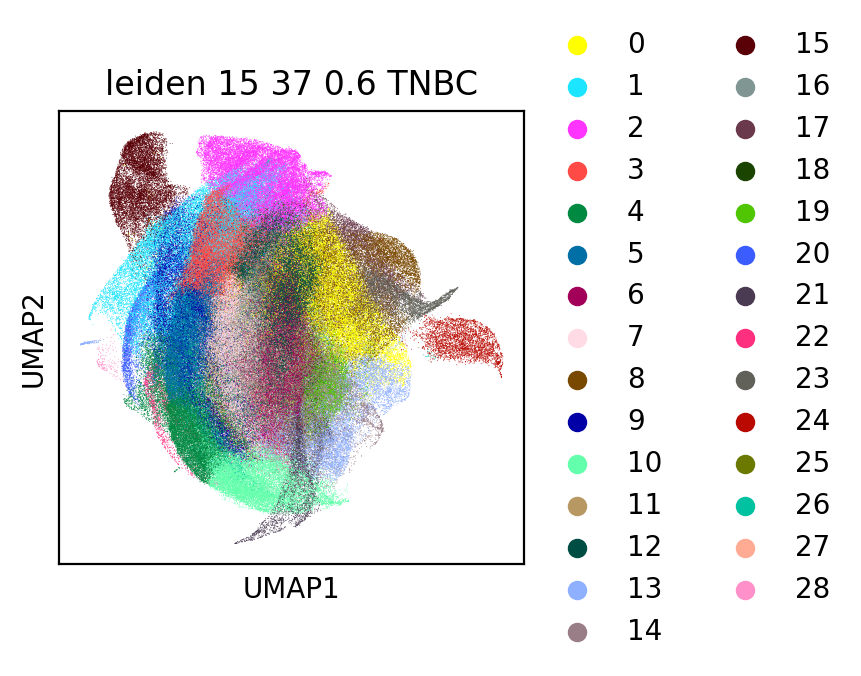

In [21]:
#leiden
resolution = 0.6
sc.tl.leiden(adata,resolution=resolution)
fig,ax = plt.subplots(figsize=(3,3),dpi=200)
figname=f'leiden_{n_neighbors}_{n_markers}_{resolution}_{s_type}.png'
sc.pl.umap(adata, color='leiden',ax=ax,save=figname,title=figname.split('.png')[0].replace('_',' '))
results_file = f'{s_sample}_{n_neighbors}neighbors_{n_markers}markers_{s_type}_leiden{resolution}.h5ad'
if not os.path.exists(results_file):
    adata.write(results_file)

## Annotate Leiden <a name="lbar"></a>

main cell types


[contents](#contents)

In [24]:
#load leiden
resolution = 0.6
s_sample = '20211115_JP-TMAs'
n_neighbors = 15
n_markers = 37
s_type = 'TNBC'
results_file = f'{s_sample}_{n_neighbors}neighbors_{n_markers}markers_{s_type}_leiden{resolution}.h5ad'
adata = sc.read_h5ad(results_file)

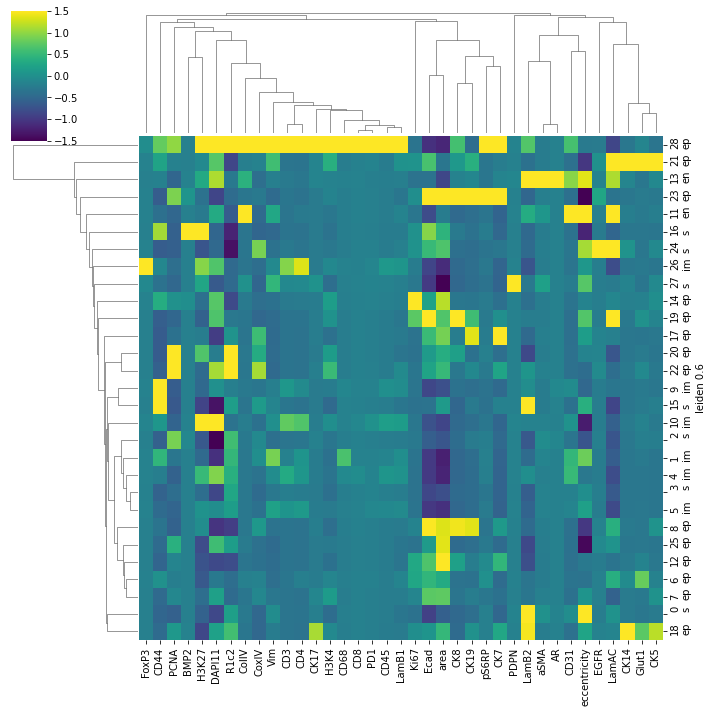

In [63]:
#clustermap
df_p = pd.DataFrame(data=adata.X,index=adata.obs.index,columns=adata.var.index)
df_p['leiden'] = adata.obs['leiden']
d_replace = {}
d_replace.update(dict(zip(tum_clust,[f'{item}\nep' for item in tum_clust])))
d_replace.update(dict(zip(imm_clust,[f'{item}\nim' for item in imm_clust])))
d_replace.update(dict(zip(str_clust,[f'{item}\ns' for item in str_clust])))
d_replace.update(dict(zip(endo_clust,[f'{item}\nen' for item in endo_clust])))
b_annot = True
if b_annot:
    df_plot = df_p.groupby('leiden').mean().rename(d_replace)
df_plot.index.name = f'leiden {resolution}'
g = sns.clustermap(df_plot,z_score=1,figsize=(10,10),cmap='viridis',
                   vmin=-1.5,vmax=1.5)
g.savefig(f'{codedir}/figures/{s_sample}_clustermap_{n_neighbors}_{n_markers}markers_{s_type}_leiden{resolution}.png',dpi=200)
marker_genes = df_p.groupby('leiden').mean().iloc[:,g.dendrogram_col.reordered_ind].columns.tolist()
categories_order = df_p.groupby('leiden').mean().iloc[g.dendrogram_row.reordered_ind,:].index.tolist()

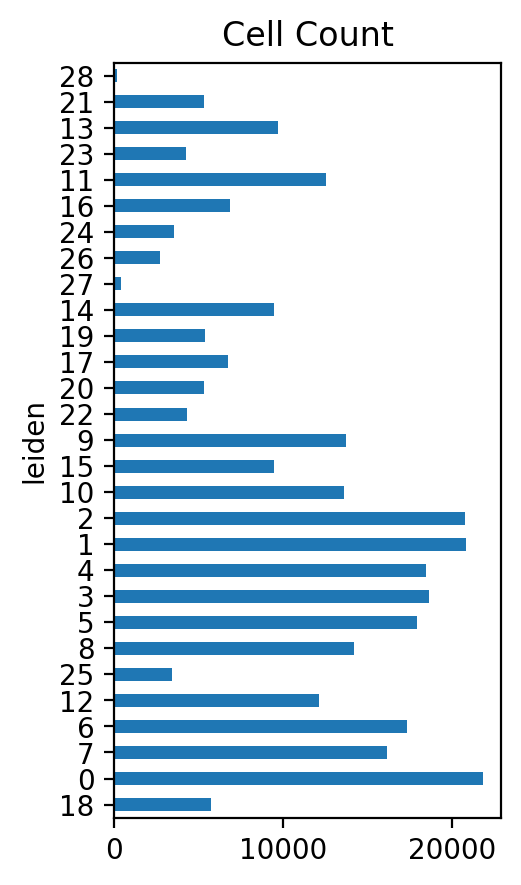

In [30]:
fig,ax=plt.subplots(figsize=(2.5,5),dpi=200)
df_p.groupby('leiden').count().loc[categories_order[::-1]].iloc[:,1].plot(kind='barh',title='Cell Count',ax=ax)
fig.savefig(f'{codedir}/{s_date}/barplot_{s_sample}_{n_neighbors}neighbors_{len(marker_genes)}markers_leiden{resolution}_{s_type}.png')

In [64]:
#CD45 above 640
#CKS above 1024
# CD68 above 1536
#area above 318
#all 30 neigh, 7 pcs

if resolution == 0.6:
    tum_clust = ['23', '17', '8', '19', '21','28','14', '20', '22',  '25', '12', '6', '7','24', '16','18'] #18?
    str_clust = ['0',  '11', '13', '15', '2',  '27', '3']
    imm_clust = ['5', '4', '10', '9', '26','1'] #1 is macrophage
    endo_clust = ['11','13']

df_p.groupby('leiden').mean().Ecad.sort_values(ascending=False)#.index
set(df_p.groupby('leiden').mean().area.sort_values(ascending=False).index) - set(tum_clust + imm_clust )
#set(tum_clust)

{'0', '11', '13', '15', '2', '27', '3'}

In [65]:
df_p.loc[df_p.leiden.isin(tum_clust),'celltype'] = 'epithelial'
df_p.loc[df_p.leiden.isin(str_clust),'celltype'] = 'stromal'
df_p.loc[df_p.leiden.isin(imm_clust),'celltype'] = 'immune'

In [66]:
'''
df_man.index = [item.split('_')[1] for item in df_man.index]
df_p_TNP = df_p.loc[df_p.index.str.contains('TNP-TMA-7')]
df_p_TNP['scene'] = [item.split('_')[1] for item in df_p_TNP.index]
s_grouper='scene'

#calculate proportions
for s_cell in ['celltype']:
    df_prop = viz.prop_positive(df_p_TNP,s_cell=s_cell,s_grouper=s_grouper)
    # make annotations
    #lut = dict(zip(sorted(df_a.ID.unique()),cm.tab10.colors))
    g, df_plot_less = viz.prop_clustermap(df_prop,pd.DataFrame(index=df_prop.index,columns=['ID']),i_thresh =.01,lut={},figsize=(6,8))
    #g.savefig(f'./figures/{s_cell}_clustermap_{n_neighbors}_{n_pcs}.png',dpi=150)
    plt.close()
    #df_man.index = [item.split('_')[1] for item in df_man.index]
    man_index = df_man[df_man.index.isin(df_plot_less.index)].index
    df_plot_less = df_plot_less.loc[man_index]
    fig = viz.prop_barplot(df_plot_less,s_cell,colormap="Spectral",figsize=(6,13),b_sort=False)
    #plt.title(f"{s_cell} {n_neighbors}n {n_pcs}pcs ")
    #fig.savefig(f'./figures/{s_cell}_{n_neighbors}_{n_pcs}_bar.png',dpi=200)
    break
df_pearson=pd.DataFrame()
s_trans = 'leiden'
#pearson
se_all = pd.Series(dtype='float64',name=s_trans)
for s_core in df_man.index:
    if df_plot_less.index.isin([s_core]).sum() > 0:
        se_test = pd.Series([scipy.stats.pearsonr(df_man.loc[s_core,:],df_plot_less.loc[s_core,:])[0]])
        df_pearson.loc[s_core,s_trans] = se_test[0]
i_mean = df_pearson.mean()[0]
plt.title(f"{s_cell} {n_neighbors}n {n_pcs}pcs {resolution}res \n pearson={i_mean}")
fig.savefig(f'./figures/{s_cell}_{n_neighbors}_{n_pcs}_{resolution}_bar.png',dpi=200)

fig = viz.prop_barplot(df_man,s_cell,colormap="Spectral",figsize=(6,13),b_sort=False)
plt.title('TNP-TMA-7 manual celltype')
fig.savefig('./figures/TNP-TMA-7_manual_celltype.png')
plt.close()
'''

'\ndf_man.index = [item.split(\'_\')[1] for item in df_man.index]\ndf_p_TNP = df_p.loc[df_p.index.str.contains(\'TNP-TMA-7\')]\ndf_p_TNP[\'scene\'] = [item.split(\'_\')[1] for item in df_p_TNP.index]\ns_grouper=\'scene\'\n\n#calculate proportions\nfor s_cell in [\'celltype\']:\n    df_prop = viz.prop_positive(df_p_TNP,s_cell=s_cell,s_grouper=s_grouper)\n    # make annotations\n    #lut = dict(zip(sorted(df_a.ID.unique()),cm.tab10.colors))\n    g, df_plot_less = viz.prop_clustermap(df_prop,pd.DataFrame(index=df_prop.index,columns=[\'ID\']),i_thresh =.01,lut={},figsize=(6,8))\n    #g.savefig(f\'./figures/{s_cell}_clustermap_{n_neighbors}_{n_pcs}.png\',dpi=150)\n    plt.close()\n    #df_man.index = [item.split(\'_\')[1] for item in df_man.index]\n    man_index = df_man[df_man.index.isin(df_plot_less.index)].index\n    df_plot_less = df_plot_less.loc[man_index]\n    fig = viz.prop_barplot(df_plot_less,s_cell,colormap="Spectral",figsize=(6,13),b_sort=False)\n    #plt.title(f"{s_cell} {n_nei

/home/exacloud/gscratch/Chin_Lab/engje/bin/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'celltype' as categorical


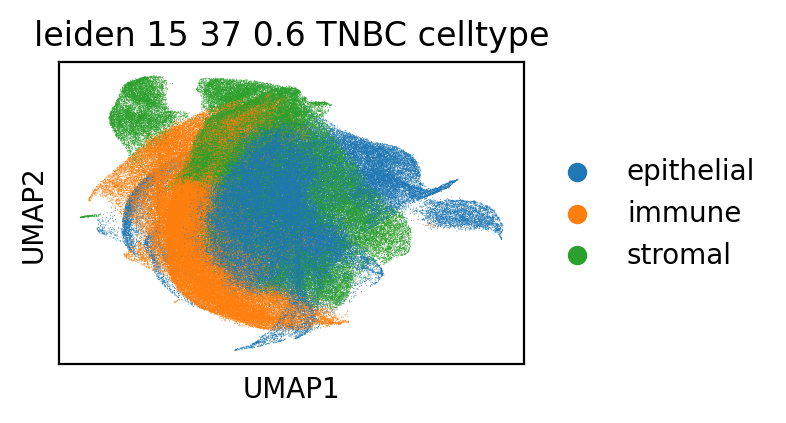

In [67]:
adata.obs['celltype'] = df_p.celltype
fig,ax = plt.subplots(figsize=(3,2),dpi=200)
figname=f'leiden_{n_neighbors}_{n_markers}_{resolution}_{s_type}_celltype.png'
sc.pl.umap(adata, color='celltype',ax=ax,save=figname,title=figname.split('.png')[0].replace('_',' '))

In [69]:
#save
s_out = f'results_{s_sample}_{n_neighbors}_{n_markers}_{s_type}_leiden{resolution}.csv'
if not os.path.exists(s_out):
    print('saving csv')
    df_p.to_csv(s_out)

saving csv
